In [1]:
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

import sys
from pathlib import Path as _Path
sys.path.insert(0, str(_Path("..").resolve()))

from pipeline import labels as pipeline_labels
from pipeline import paths as pipeline_paths

In [2]:
#Read label files

# pipeline.labels.load_label_map() honors a real
# ../data/chinese_traffic_signs/labels.csv if present, else falls back to
# the numeric category id as the display label (this Kaggle dataset does
# not ship a labels.csv).
label_map = pipeline_labels.load_label_map()

print("Number of class names:", len(label_map))
print(label_map)

Number of class names: 58
{0: '0', 1: '1', 2: '2', 3: '3', 4: '4', 5: '5', 6: '6', 7: '7', 8: '8', 9: '9', 10: '10', 11: '11', 12: '12', 13: '13', 14: '14', 15: '15', 16: '16', 17: '17', 18: '18', 19: '19', 20: '20', 21: '21', 22: '22', 23: '23', 24: '24', 25: '25', 26: '26', 27: '27', 28: '28', 29: '29', 30: '30', 31: '31', 32: '32', 33: '33', 34: '34', 35: '35', 36: '36', 37: '37', 38: '38', 39: '39', 40: '40', 41: '41', 42: '42', 43: '43', 44: '44', 45: '45', 46: '46', 47: '47', 48: '48', 49: '49', 50: '50', 51: '51', 52: '52', 53: '53', 54: '54', 55: '55', 56: '56', 57: '57'}


In [3]:
FEATURE_DIR = pipeline_paths.FEATURE_DIR

TRAIN_FILE = (
    FEATURE_DIR
    / "chinese_traffic_signs_hog_features_train.npz"
)

TEST_FILE = (
    FEATURE_DIR
    / "chinese_traffic_signs_hog_features_test.npz"
)


train_data = np.load(
    TRAIN_FILE
)

test_data = np.load(
    TEST_FILE
)


X_train_full = train_data["X"]
y_train_full = train_data["y"]
train_filenames = train_data["filenames"]

X_test = test_data["X"]
y_test = test_data["y"]
test_filenames = test_data["filenames"]


print(
    "Training features:",
    X_train_full.shape
)

print(
    "Training labels:",
    y_train_full.shape
)

print(
    "Training filenames:",
    train_filenames.shape
)

print(
    "Testing features:",
    X_test.shape
)

print(
    "Testing labels:",
    y_test.shape
)

print(
    "Testing filenames:",
    test_filenames.shape
)

Training features: (4719, 1764)
Training labels: (4719,)
Training filenames: (4719,)
Testing features: (1177, 1764)
Testing labels: (1177,)
Testing filenames: (1177,)


In [4]:
print(
    "Number of training samples:",
    len(X_train_full)
)

print(
    "Number of testing samples:",
    len(X_test)
)

print(
    "Number of classes:",
    len(np.unique(y_train_full))
)

print(
    "Classes:",
    np.unique(y_train_full)
)

print(
    "HOG features per image:",
    X_train_full.shape[1]
)

Number of training samples: 4719
Number of testing samples: 1177
Number of classes: 58
Classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57]
HOG features per image: 1764


In [5]:
print(
    "NaN in training:",
    np.isnan(X_train_full).any()
)

print(
    "NaN in testing:",
    np.isnan(X_test).any()
)

print(
    "Infinity in training:",
    np.isinf(X_train_full).any()
)

print(
    "Infinity in testing:",
    np.isinf(X_test).any()
)

NaN in training: False
NaN in testing: False
Infinity in training: False
Infinity in testing: False


In [6]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train_full,
    y_train_full,
    test_size=0.20,
    random_state=42,
    stratify=y_train_full
)

print(
    "Training set:",
    X_train.shape
)

print(
    "Validation set:",
    X_val.shape
)

print(
    "Final test set:",
    X_test.shape
)

Training set: (3775, 1764)
Validation set: (944, 1764)
Final test set: (1177, 1764)


In [7]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(
    X_train
)

X_val_scaled = scaler.transform(
    X_val
)

X_test_scaled = scaler.transform(
    X_test
)

print(
    "Feature scaling completed."
)

Feature scaling completed.


In [8]:
C_values = [
    0.01,
    0.1,
    1,
    10,
    100
]

results = []

for C in C_values:

    logistic_model = LogisticRegression(
        C=C,
        solver="lbfgs",
        max_iter=5000,
        random_state=42
    )

    logistic_model.fit(
        X_train_scaled,
        y_train
    )

    y_val_pred = logistic_model.predict(
        X_val_scaled
    )

    accuracy = accuracy_score(
        y_val,
        y_val_pred
    )

    precision = precision_score(
        y_val,
        y_val_pred,
        average="macro",
        zero_division=0
    )

    recall = recall_score(
        y_val,
        y_val_pred,
        average="macro",
        zero_division=0
    )

    f1 = f1_score(
        y_val,
        y_val_pred,
        average="macro",
        zero_division=0
    )

    results.append({
        "C": C,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-score": f1
    })


results_df = pd.DataFrame(
    results
)

display(
    results_df
)

,C,Accuracy,Precision,Recall,F1-score
0,0.01,0.971398,0.965330,0.937921,0.949606
1,0.10,0.973517,0.965163,0.941746,0.951614
2,1.00,0.972458,0.959762,0.939834,0.947311
3,10.00,0.973517,0.961256,0.939700,0.948602
4,100.00,0.973517,0.961256,0.939700,0.948602


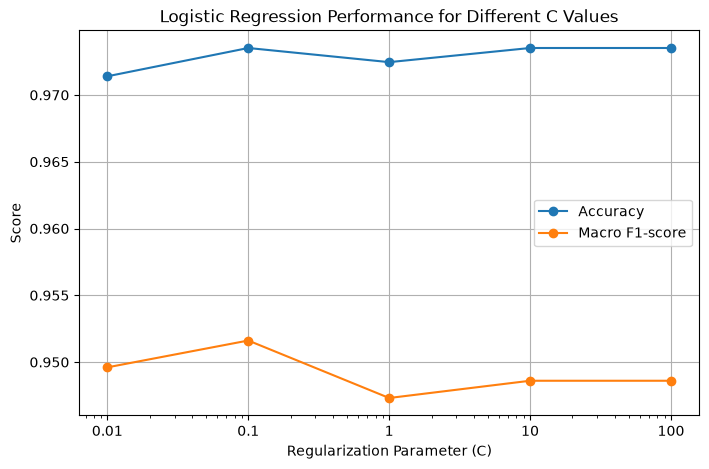

In [9]:
plt.figure(
    figsize=(8, 5)
)

plt.plot(
    results_df["C"],
    results_df["Accuracy"],
    marker="o",
    label="Accuracy"
)

plt.plot(
    results_df["C"],
    results_df["F1-score"],
    marker="o",
    label="Macro F1-score"
)

plt.xscale("log")

plt.xlabel(
    "Regularization Parameter (C)"
)

plt.ylabel(
    "Score"
)

plt.title(
    "Logistic Regression Performance "
    "for Different C Values"
)

plt.xticks(
    C_values,
    C_values
)

plt.legend()

plt.grid()

plt.show()

In [10]:
best_row = results_df.loc[
    results_df["F1-score"].idxmax()
]

best_C = float(
    best_row["C"]
)

print(
    "Best C:",
    best_C
)

print(
    "Validation Accuracy:",
    round(
        best_row["Accuracy"],
        4
    )
)

print(
    "Validation Macro F1:",
    round(
        best_row["F1-score"],
        4
    )
)

Best C: 0.1
Validation Accuracy: 0.9735
Validation Macro F1: 0.9516


In [11]:
final_scaler = StandardScaler()

X_train_full_scaled = (
    final_scaler.fit_transform(
        X_train_full
    )
)

X_test_final_scaled = (
    final_scaler.transform(
        X_test
    )
)

In [12]:
final_logistic = LogisticRegression(
    C=best_C,
    solver="lbfgs",
    max_iter=5000,
    random_state=42
)

final_logistic.fit(
    X_train_full_scaled,
    y_train_full
)

y_train_pred = final_logistic.predict(
    X_train_full_scaled
)

print(
    f"Final Logistic Regression trained "
    f"with C = {best_C}"
)

Final Logistic Regression trained with C = 0.1


In [13]:
from PIL import Image

DATASET_DIR = Path(
    "../data/chinese_traffic_signs"
)

IMAGE_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".ppm"
}

all_images = [
    p for p in DATASET_DIR.rglob("*")
    if p.is_file()
    and p.suffix.lower()
    in IMAGE_EXTENSIONS
]

image_lookup = {
    p.name: p
    for p in all_images
}

print(
    "Images found:",
    len(image_lookup)
)

Images found: 5998


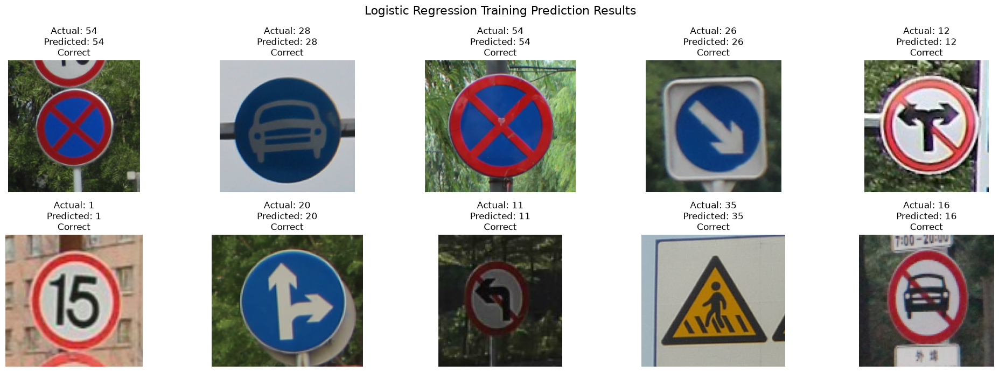

In [14]:
sample_count = min(
    10,
    len(y_train_full)
)

sample_indices = np.linspace(
    0,
    len(y_train_full) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()


for ax, index in zip(
    axes,
    sample_indices
):

    filename = str(
        train_filenames[index]
    )

    actual = int(
        y_train_full[index]
    )

    predicted = int(
        y_train_pred[index]
    )

    image_path = image_lookup.get(
        filename
    )

    if image_path is not None:

        image = Image.open(
            image_path
        ).convert("RGB")

        ax.imshow(
            image
        )

    correct = (
        actual == predicted
    )

    ax.set_title(
        f"Actual: {label_map[actual]}\n"
        f"Predicted: {label_map[predicted]}\n"
        f"{'Correct' if correct else 'Wrong'}"
    )

    ax.axis("off")


plt.suptitle(
    "Logistic Regression "
    "Training Prediction Results",
    fontsize=16
)

plt.tight_layout()

plt.show()

In [15]:
y_test_pred = final_logistic.predict(
    X_test_final_scaled
)

In [16]:
test_accuracy = accuracy_score(
    y_test,
    y_test_pred
)

test_precision = precision_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)

test_recall = recall_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)

test_f1 = f1_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)


print(
    "Logistic Regression Final Test Results"
)

print(
    "--------------------------------------"
)

print(
    f"Accuracy  : {test_accuracy:.4f}"
)

print(
    f"Precision : {test_precision:.4f}"
)

print(
    f"Recall    : {test_recall:.4f}"
)

print(
    f"F1-score  : {test_f1:.4f}"
)

Logistic Regression Final Test Results
--------------------------------------
Accuracy  : 0.9898
Precision : 0.9943
Recall    : 0.9928
F1-score  : 0.9933


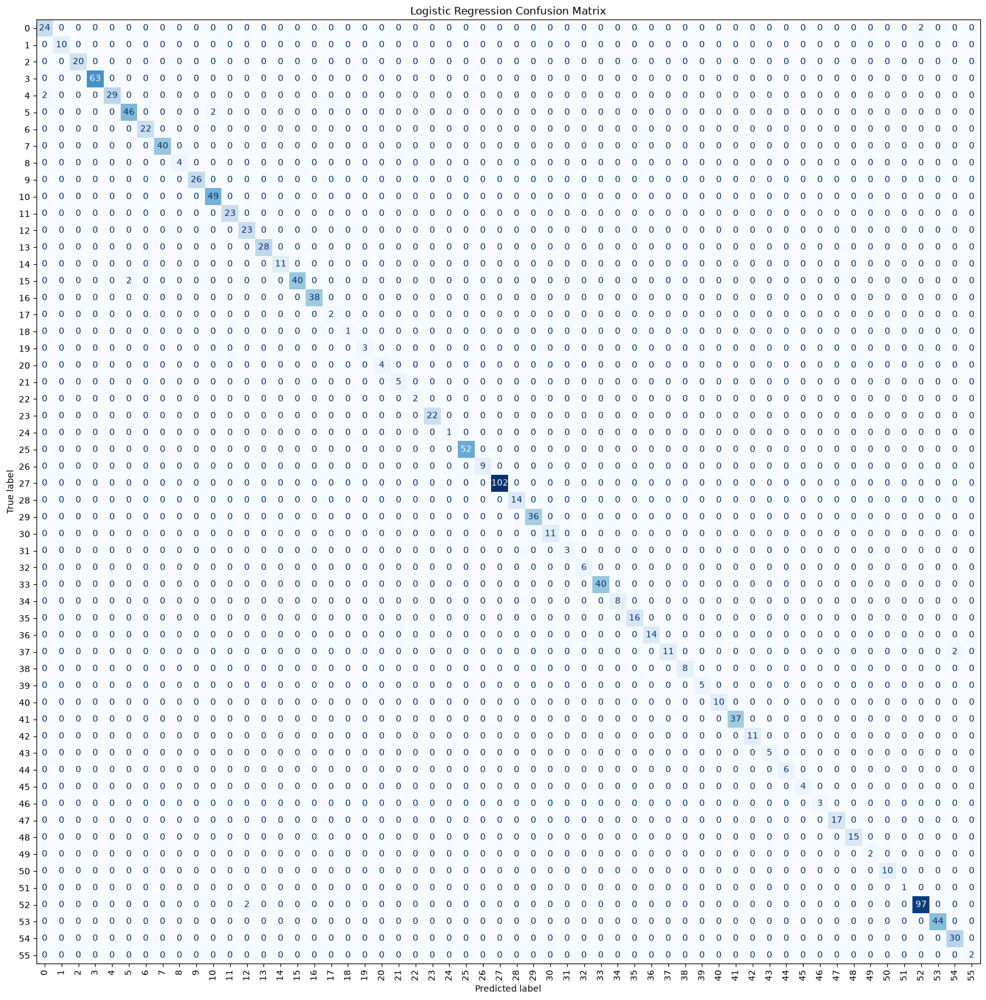

In [17]:
cm = confusion_matrix(
    y_test,
    y_test_pred
)

fig, ax = plt.subplots(
    figsize=(16, 16)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

plt.title(
    "Logistic Regression "
    "Confusion Matrix"
)

plt.tight_layout()

plt.show()

In [18]:
sample_count = min(
    10,
    len(y_test)
)

sample_indices = np.linspace(
    0,
    len(y_test) - 1,
    sample_count,
    dtype=int
)

prediction_results = []

for index in sample_indices:

    actual = int(
        y_test[index]
    )

    predicted = int(
        y_test_pred[index]
    )

    prediction_results.append({
        "Test Index": index,
        "Actual Class": actual,
        "Predicted Class": predicted,
        "Correct":
            actual == predicted
    })


prediction_df = pd.DataFrame(
    prediction_results
)

display(
    prediction_df
)

,Test Index,Actual Class,Predicted Class,Correct
0,0,54,54,True
1,130,29,29,True
2,261,10,10,True
3,392,55,55,True
4,522,55,55,True
5,653,11,11,True
6,784,16,16,True
7,914,10,10,True
8,1045,16,16,True
9,1176,3,3,True


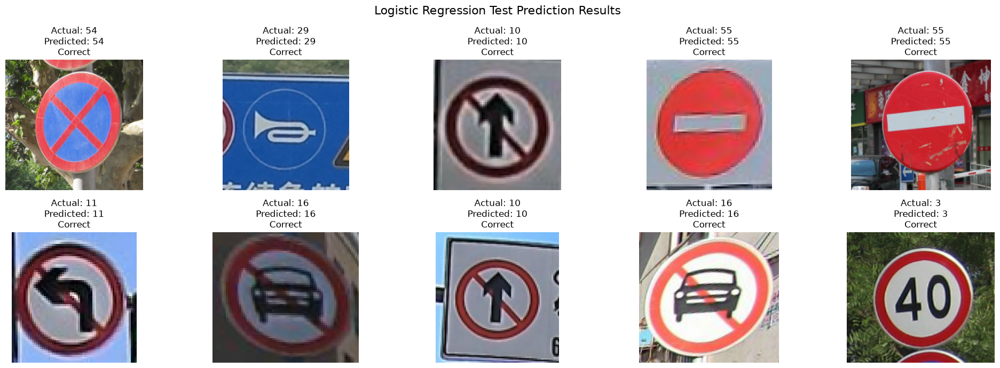

In [19]:
sample_count = min(
    10,
    len(y_test)
)

sample_indices = np.linspace(
    0,
    len(y_test) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()


for ax, index in zip(
    axes,
    sample_indices
):

    filename = str(
        test_filenames[index]
    )

    actual = int(
        y_test[index]
    )

    predicted = int(
        y_test_pred[index]
    )

    image_path = image_lookup.get(
        filename
    )

    if image_path is not None:

        image = Image.open(
            image_path
        ).convert("RGB")

        ax.imshow(
            image
        )

    correct = (
        actual == predicted
    )

    ax.set_title(
        f"Actual: {label_map[actual]}\n"
        f"Predicted: {label_map[predicted]}\n"
        f"{'Correct' if correct else 'Wrong'}"
    )

    ax.axis("off")


plt.suptitle(
    "Logistic Regression Test "
    "Prediction Results",
    fontsize=16
)

plt.tight_layout()

plt.show()

In [20]:
#def function to provide the segemented image with black background 
#and def function to display the result

In [21]:
# pipeline.preprocessing.get_roi() is the exact same segment+mask routine
# 01-roi-segmentation and 02-feature-extraction use to build the HOG
# features loaded above - reusing it here (rather than a separate
# hand-rolled segmentation copy) means these visualizations show precisely
# what fed the classifier, not an approximation of it.
from pipeline import preprocessing as pipeline_preprocessing

In [22]:
def get_segmented_image(image_path):
    """Same pipeline.preprocessing.get_roi() the feature-extraction
    notebooks call - not a separate hand-rolled segmentation copy - so this
    visualization matches exactly what fed the classifier's HOG features.
    get_roi() already blacks out the background, so roi_rgb is used as-is."""

    image_bgr = cv2.imread(str(image_path))
    original_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    roi = pipeline_preprocessing.get_roi(original_rgb)
    segmented_rgb = original_rgb if roi is None else roi[0]

    return original_rgb, segmented_rgb

In [23]:
def display_prediction_results(
    filenames,
    y_true,
    y_pred,
    image_lookup,
    title
):

    sample_indices = np.linspace(
        0,
        len(filenames) - 1,
        10,
        dtype=int
    )

    fig, axes = plt.subplots(
        10,
        2,
        figsize=(10, 36)
    )

    for row, index in enumerate(sample_indices):

        filename = Path(
            str(filenames[index])
        ).name

        image_path = image_lookup.get(
            filename
        )

        actual = int(y_true[index])
        predicted = int(y_pred[index])

        if image_path is None:
            continue

        original, segmented = get_segmented_image(
            image_path
        )

        # Original image
        axes[row, 0].imshow(original)

        axes[row, 0].set_title(
            f"Original - {filename}"
        )

        axes[row, 0].axis("off")

        # Segmented image
        axes[row, 1].imshow(segmented)

        axes[row, 1].set_title(
            f"Actual: {label_map[actual]}\n"
            f"Predicted: {label_map[predicted]}\n"
            f"{'Correct' if actual == predicted else 'Wrong'}"
        )

        axes[row, 1].axis("off")

    plt.suptitle(
        title,
        fontsize=16,
        y=0.995
    )
    
    plt.subplots_adjust(
        top=0.96,
        bottom=0.02,
        hspace=0.65,
        wspace=0.25
    )
    
    plt.show()

In [24]:
#Test on assignment 1 inputs

In [25]:
assignment_data = np.load(
    "../features/"
    "assignment1_test_hog_features.npz"
)

X_assignment_test = (
    assignment_data["X"]
)

# Bare filenames, not paths - kept as `assignment_image_paths` since
# every downstream cell only ever does Path(str(x)).name on it, which
# is a no-op on an already-bare name.
assignment_image_paths = (
    assignment_data["filenames"]
)


print(
    "Assignment test features:",
    X_assignment_test.shape
)

Assignment test features: (84, 1764)


In [26]:
X_assignment_test_scaled = (
    final_scaler.transform(
        X_assignment_test
    )
)

print(
    "Scaled Assignment test shape:",
    X_assignment_test_scaled.shape
)

Scaled Assignment test shape: (84, 1764)


In [27]:
import time

y_assignment_pred = []
classification_times = []

for i in range(
    len(X_assignment_test_scaled)
):

    # One image feature vector
    X_one = X_assignment_test_scaled[
        i:i + 1
    ]

    # Start timer
    start_time = time.perf_counter()

    # KNN classification
    prediction = final_logistic.predict(
        X_one
    )[0]

    # End timer
    end_time = time.perf_counter()

    runtime = (
        end_time - start_time
    )

    y_assignment_pred.append(
        prediction
    )

    classification_times.append(
        runtime
    )


# Convert to NumPy array
y_assignment_pred = np.array(
    y_assignment_pred
)

classification_times = np.array(
    classification_times
)



In [28]:
print(
    "KNN Classification Runtime"
)

print(
    "--------------------------"
)

print(
    f"Average time per image : "
    f"{classification_times.mean():.6f} seconds"
)

print(
    f"Maximum time per image : "
    f"{classification_times.max():.6f} seconds"
)

print(
    f"Minimum time per image : "
    f"{classification_times.min():.6f} seconds"
)

print(
    f"All images below 2 sec : "
    f"{np.all(classification_times < 2)}"
)

KNN Classification Runtime
--------------------------
Average time per image : 0.000423 seconds
Maximum time per image : 0.000807 seconds
Minimum time per image : 0.000315 seconds
All images below 2 sec : True


In [29]:
print(
    "Number of predictions:",
    len(y_assignment_pred)
)

print(
    "First 10 predictions:",
    y_assignment_pred[:10]
)

Number of predictions: 84
First 10 predictions: [ 1  2  5 20 20 20 21 21 27 31]


In [30]:
# The true label used to be regex-parsed from the filename (its first
# three digits). It is now saved directly by
# 02-feature-extraction/01_hog_features_chinese.ipynb (pulled from
# annotations.csv, not guessed from the filename) - see the next cell.
pass

In [31]:
y_assignment_test = assignment_data["y"]

print(
    "Actual labels:",
    y_assignment_test.shape
)

print(
    "First 10 actual labels:",
    y_assignment_test[:10]
)

Actual labels: (84,)
First 10 actual labels: [ 1  2  5 20 20 20 21 21 27 31]


In [32]:
assignment_accuracy = accuracy_score(
    y_assignment_test,
    y_assignment_pred
)

assignment_precision = precision_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)

assignment_recall = recall_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)

assignment_f1 = f1_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)


print(
    "Logistic Regression Results "
    "on 84 Assignment Test Images"
)

print(
    "-----------------------------------------"
)

print(
    f"Accuracy  : "
    f"{assignment_accuracy:.4f}"
)

print(
    f"Precision : "
    f"{assignment_precision:.4f}"
)

print(
    f"Recall    : "
    f"{assignment_recall:.4f}"
)

print(
    f"F1-score  : "
    f"{assignment_f1:.4f}"
)

Logistic Regression Results on 84 Assignment Test Images
-----------------------------------------
Accuracy  : 1.0000
Precision : 1.0000
Recall    : 1.0000
F1-score  : 1.0000


In [33]:
assignment_results = []

for image_path, actual, predicted in zip(
    assignment_image_paths,
    y_assignment_test,
    y_assignment_pred
):

    actual = int(
        actual
    )

    predicted = int(
        predicted
    )

    assignment_results.append({

        "Filename":
            Path(
                str(image_path)
            ).name,

        "Actual Class":
            actual,

        "Actual Sign":
            label_map.get(
                actual,
                f"Class {actual}"
            ),

        "Predicted Class":
            predicted,

        "Predicted Sign":
            label_map.get(
                predicted,
                f"Class {predicted}"
            ),

        "Correct":
            actual == predicted
    })


assignment_results_df = pd.DataFrame(
    assignment_results
)

display(
    assignment_results_df
)

,Filename,Actual Class,Actual Sign,Predicted Class,Predicted Sign,Correct
0,001_0004.png,1,1,1,1,True
1,002_0036.png,2,2,2,2,True
2,005_0030.png,5,5,5,5,True
3,020_0003.png,20,20,20,20,True
4,020_0004.png,20,20,20,20,True
...,...,...,...,...,...,...
79,029_1_0015.png,29,29,29,29,True
80,031_1_0020.png,31,31,31,31,True
81,036_1_0014.png,36,36,36,36,True
82,036_1_0016.png,36,36,36,36,True


In [34]:
import sys
from pathlib import Path as _Path
sys.path.insert(0, str(_Path("..").resolve()))
from pipeline import annotations as pipeline_annotations

# Images are never moved out of DATASET_DIR (see
# 00-dataset/02_clean_annotations.ipynb) - there is no separate
# data/Inputs/ folder to look for.
assignment_images = pipeline_annotations.list_dataset_images()

assignment_image_lookup = {
    p.name: p
    for p in assignment_images
}

print(
    "Dataset images available for visualisation:",
    len(assignment_images)
)

Dataset images available for visualisation: 5998


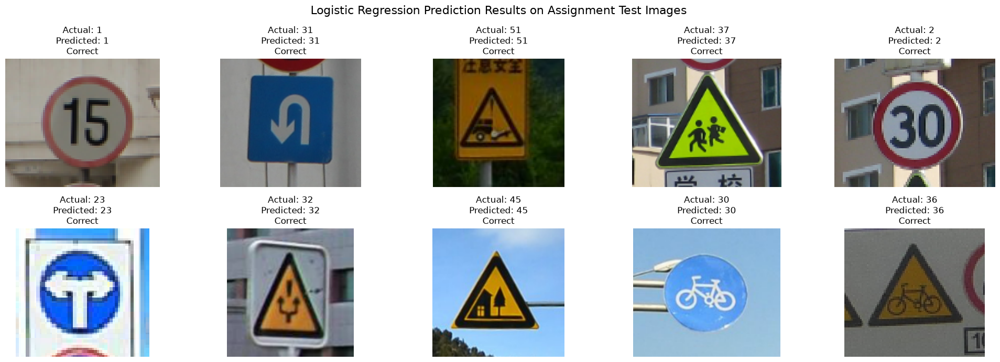

In [35]:
sample_count = min(
    10,
    len(assignment_image_paths)
)

sample_indices = np.linspace(
    0,
    len(assignment_image_paths) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()


for ax, index in zip(
    axes,
    sample_indices
):

    filename = Path(
        str(
            assignment_image_paths[index]
        )
    ).name

    actual = int(
        y_assignment_test[index]
    )

    predicted = int(
        y_assignment_pred[index]
    )

    image_path = (
        assignment_image_lookup.get(
            filename
        )
    )

    if image_path is not None:

        image = Image.open(
            image_path
        ).convert("RGB")

        ax.imshow(
            image
        )

    correct = (
        actual == predicted
    )

    ax.set_title(
        f"Actual: {label_map[actual]}\n"
        f"Predicted: {label_map[predicted]}\n"
        f"{'Correct' if correct else 'Wrong'}"
    )

    ax.axis("off")


plt.suptitle(
    "Logistic Regression Prediction Results "
    "on Assignment Test Images",
    fontsize=16
)

plt.tight_layout()

plt.show()

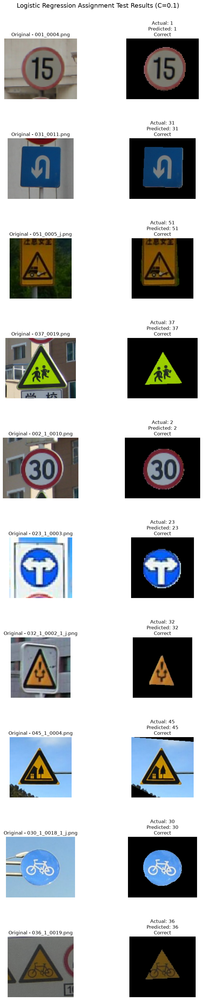

In [36]:
display_prediction_results(
    assignment_image_paths,
    y_assignment_test,
    y_assignment_pred,
    assignment_image_lookup,
    f"Logistic Regression Assignment Test Results (C={best_C})"
)

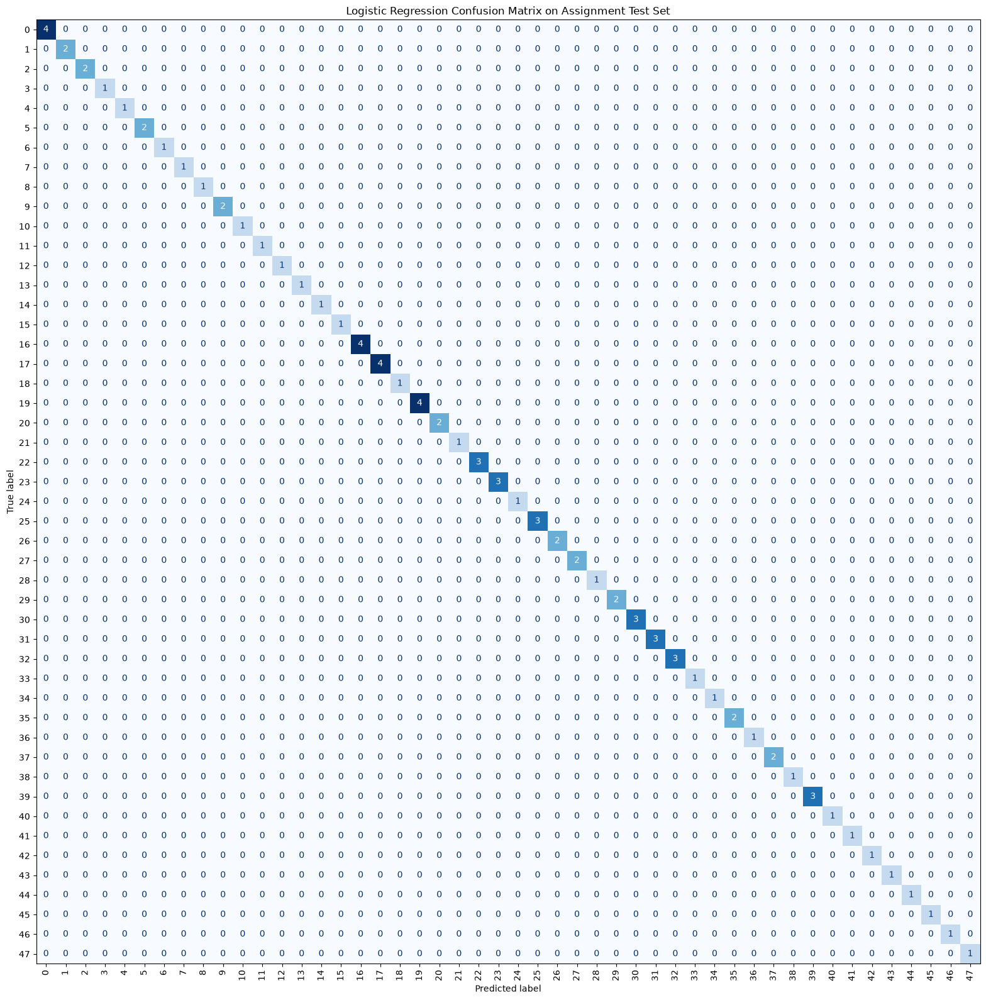

In [37]:
cm = confusion_matrix(
    y_assignment_test,
    y_assignment_pred
)

fig, ax = plt.subplots(
    figsize=(16, 16)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

plt.title(
    "Logistic Regression Confusion Matrix "
    "on Assignment Test Set"
)

plt.tight_layout()

plt.show()

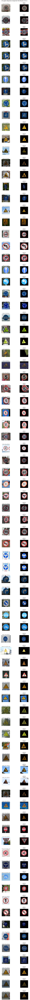

In [38]:
# Display ALL assignment test results

total_results = len(assignment_image_paths)

fig, axes = plt.subplots(
    total_results,
    2,
    figsize=(10, 2.8 * total_results),
    squeeze=False
)

for row, index in enumerate(
    range(total_results)
):

    filename = Path(
        str(assignment_image_paths[index])
    ).name

    actual = int(
        y_assignment_test[index]
    )

    predicted = int(
        y_assignment_pred[index]
    )

    correct = (
        actual == predicted
    )

    image_path = assignment_image_lookup.get(
        filename
    )

    if image_path is None:
        axes[row, 0].axis("off")
        axes[row, 1].axis("off")
        continue

    # Get original and segmented image
    original, segmented = get_segmented_image(
        image_path
    )

    # -------------------------
    # Original image
    # -------------------------
    axes[row, 0].imshow(
        original
    )

    axes[row, 0].set_title(
        f"Original - {filename}",
        fontsize=9
    )

    axes[row, 0].axis(
        "off"
    )

    # -------------------------
    # Segmented image
    # -------------------------
    axes[row, 1].imshow(
        segmented
    )

    axes[row, 1].set_title(
        f"Actual: {label_map.get(actual, actual)}\n"
        f"Predicted: {label_map.get(predicted, predicted)}\n"
        f"{'Correct' if correct else 'Wrong'}",
        fontsize=9
    )

    axes[row, 1].axis(
        "off"
    )


plt.suptitle(
    f"All Logistic Regression Assignment Test Results (C={best_C})",
    fontsize=16,
    y=0.999
)

plt.subplots_adjust(
    top=0.995,
    bottom=0.005,
    hspace=0.6,
    wspace=0.25
)

plt.show()